<a href="https://colab.research.google.com/github/jaireddy2280/UL-Autumn-sem/blob/main/Assignment1a_2D_Transforms_9539719.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Activity 1a - 2D Image Transformations

**Name:** Jason Coleman

**ID number:** 9539719

In this activity, we are going to look into 2D image transformations. We are going to look into the basics of image warping, including back-mapping to fill vacant pixels. We we also get the first taste of homogeneous coordinates and homogeneous transformations.

But first, we will start with the basics.

A couple of general notes.
 * First, I will often give you some template code to start working from in the cells. I will denote areas where you should insert your own code with a "your code here" comment.  
 * Occasionally, I will ask questions that you must also answer. These will be highlighted in a different colour.
 * In the first task of the module, some code is provided below, to help you on your way. However, as we progress through the module, I will give you less and less code to start.
 * I also spell out the steps in quite some detail here, however, as we progress, I will expect to not have to give such detail.
 * You must not use external libraries other than numpy for calculations and pyplot for displaying the images. We use OpenCV just to read the images - but this must not be used elsewhere. All the libraries are imported in the first cell.

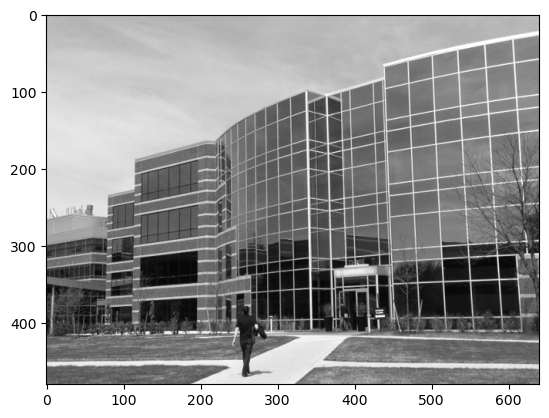

In [ ]:
###################
# code given
import cv2                      # we use this mainly to read the files
import numpy as np              # the everpresent numpy
import matplotlib.pyplot as plt # does what it says on the tin - plotting

# Read in the image. We don't want to mess with colour, so we convert to grayscale.
# Let's also have a look at the image
img = cv2.imread('building1.jpg',cv2.IMREAD_GRAYSCALE)
plt.imshow(img,cmap='gray')

## A simple scaling

We want to implement a simple scaling, as is described in Video Lecture 1.2

The transform for scaling is given by the matrix:
$$
\textbf{T} = \begin{bmatrix}
a & 0 \\
0 & b
\end{bmatrix}
$$
and thus, to transform the points in the image, we use
$$
\begin{bmatrix} x' \\ y' \end{bmatrix} =
\begin{bmatrix}
a & 0 \\
0 & b
\end{bmatrix}  
\begin{bmatrix} x \\ y \end{bmatrix}
$$
where $(x, y)$ is the point in the original image, and $(x', y')$ is the transformed point.


<font color='blue'>

#### Task:
    
In Python code, implement the scaling defined by the equations above. For each pixel in the original image, we will apply the transform, and put the pixel value at the resulting position in the output image.
    
1. Create the transformation matrix
1. Create an empty (black) image where the new image will be stored (hint [`np.zeros()`](https://numpy.org/doc/stable/reference/generated/numpy.zeros.html))
1. Iterate over all the pixels in the image (e.g., as a nested pair of for loops)
1. Apply the transformation to each pixel location (i.e., to the vector $(x, y)$ representing the pixel location). Get the result $(x', y')$ vector
1. Check that the resulting location $(x', y')$ is within the bounds of the image. You will get an error if you try to write outside of the image boundary.
1. Copy the pixel value from the input image location $(x, y)$ to the (valid) output image location $(x', y')$ (interpolated).
1. Display the resulting image ([`plt.imshow()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html), as above)

    
Some hints:
* Images are stored in grids, and the index (coordinate $(x, y)$) of each grid is an integer value. However, after you transform the integer coordinate using $\textbf{T}$, there is no guarantee that the resulting coordinates $(x', y')$ will be integer values.
* What do we do? This requires [**interpolation**](https://www.cambridgeincolour.com/tutorials/image-interpolation.htm), of which two popular methods are _bilinear_ and _bicubic_. However, for this task, we will just round our values to the nearest integer (which is, in fact, called _nearest neighbour_ interpolation).
* To do this, once you have transformed a point, I suggest to round to the nearest integer using [`np.rint()`](https://numpy.org/doc/stable/reference/generated/numpy.rint.html) and then cast to an `int` type using [`.astype(int)`](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.astype.html)
    
</font>

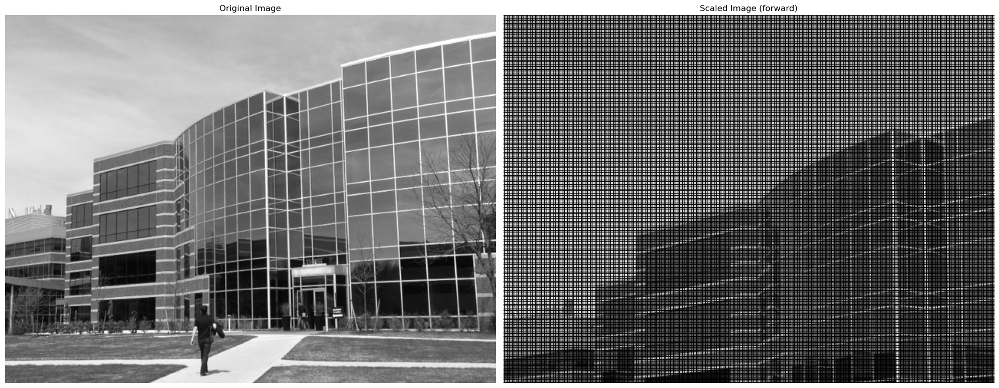

In [ ]:
##################
# Your code here
def create_scale_matrix(scale_a, scale_b):
    """
    Create a 2D scaling matrix

    :param scale_a: Scale factor along x-axis
    :param scale_b: Scale factor along y-axis

    returns: 2D scaling matrix
    """
    return np.array([
        [scale_a, 0],
        [0, scale_b]
    ])

def create_uniform_scale_matrix(scale_factor):
    """
    Create a 2D scaling matrix - This is here for
    illustrative purposes, I'll use the create_scale_matrix
    function instead

    :param scale_factor: scale by the same factor in both x and y

    returns: 2D scaling matrix
    """
    return np.array([
        [scale_factor, 0],
        [0, scale_factor]
    ])

scale_a = 1.5  # Scale factor along x-axis
scale_b = 1.5  # Scale factor along y-axis

T = create_scale_matrix(scale_a, scale_b)

# Create a new empty image of the size of the original
img_new = np.zeros(img.shape)

for y in range(img.shape[0]):  # iterate each row in the image
    for x in range(img.shape[1]):  # iterate each column
        pt = np.array([x,y])

        pt_new = T @ pt

        # Your code here
        x_new, y_new = np.rint(pt_new).astype(int) # NN rounding

        # check that the resulting point is within the image bounds
        if 0 <= x_new < img_new.shape[1] and 0 <= y_new < img_new.shape[0]:
            img_new[y_new][x_new] = img[y][x]

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Scaled Image (forward)")
plt.imshow(img_new, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

<font color='blue'>

## Question: Some of the image has disappeared. Why? [Hint](https://blogs.mathworks.com/steve/2006/04/28/spatial-transforms-forward-mapping/)

<font color='green'>

## Answer
There are a couple of ways to interpret the word "disappeared".

1) In the first case we are upscaling into an image of exactly the same dimensions as the original. When applying a scaling transformation with a factor greater than 1, the original pixels are effectively “spread out” in the destination image. Each pixel in the original image now occupies a larger space in the destination image (e.g. if we are scaling a and b by 2, then each pixel in the original image now maps to 2x2 pixels in the output image). If the destination image is the same size as the input image, then some of the pixels in the input image will map to a region outside of the bounds of the output region - they will have disappeared. The way to resolve this is to determine the bounds of the output image, required to hold all of the transformed input data, and then perform the mapping from input to output, through the mapping function.

    We can see this in the following example. A rotation of 90 degrees, followed by a shear puts the transformed image outside the space occupied by the original image. It has effectively disappeared (as we keep the output image the same size as the input image).

![image.png](attachment:image.png)

<font color='green'>
    2. A second reason as to why parts of the image may have appeared to disappear relates to the next question (i.e. why parts of the image seem to have disappeared, and gaps have manifested).

<font color='blue'>

## Question: Make sure your matrix contains scaling factors greater than 1 (i.e., causing an upscaling). Why are there black pixels?

<font color='green'>

## Answer
The forward mapping function maps each pixel from the input image to a corresponding pixel in the output image. Since pixel coordinates are integers (positive and unsigned in this case), but the transformation may produce floating-point coordinates (depending on the chosen upscaling parameters), the mapped positions need to be rounded (in this case, using nearest-neighbor interpolation).

This rounding introduces aliasing, where multiple input pixels *may* map to the same output pixel. As a result, gaps (unassigned pixels) can appear in the output image, since there is no guarantee that every pixel in the output image will be uniquely covered.

To solve this problem, we use backward mapping: Instead of mapping input pixels forward, we iterate over each pixel in the output image and determine its corresponding location in the input image via the inverse transform (we take the desired transform and invert it, then apply that to every pixel in the output image). This approach ensures that every output pixel receives a valid value, effectively eliminating gaps.

## Back-mapping the pixels

In the last task, we ended up with black pixels (vacant pixels) in the resulting image. Now we will address this using the method of back mapping, also call [inverse mapping](https://blogs.mathworks.com/steve/2006/05/05/spatial-transformations-inverse-mapping/).

Let's look at forward mapping first. Consider each input image pixel in turn. For each input image pixel:

Forward mapping:
1. Determine its location in input space, $(x, y)$.
1. Map that location to output space using $(x',y')^\top = \textbf{T}(x,y)^\top$.
1. Figure out which output pixel contains the location $(x',y')$. I.e., convert to integer values.
1. Copy the input pixel value to that output pixel.

This diagram illustrates the procedure:
![image-3.png](attachment:image-3.png)


Forward mapping has two main disadvantages as a computational procedure: gaps and overlaps. Depending on specific spatial transform function, you may have some output pixels that did not receive any input image pixels; these are the gaps. You may also have some output pixels that received more than one input image pixel; these are the overlaps. In both cases, it is challenging to figure out a reasonable way to set those output pixels.

Because of the disadvantages of the forward mapping method, most of the practical implementations use a different technique, called back/inverse mapping.

Here's how it works:

Locate your output image pixel grid somewhere in output space. Then for each output pixel on the grid:

1. Apply the **inverse** spatial transformation to determine the corresponding location in input space: $(x,y)^\top = \textbf{T}^{-1}(x',y')^\top$.
1. Using the input image pixels nearest to $(x,y)$, *interpolate* to get an approximate value for the input image at $(x,y)$.
1. Use that value for the output pixel.

This diagram illustrates the procedure:
![image-2.png](attachment:image-2.png)

This method completely avoids problems with gaps and overlaps. You just have to decide which interpolation method to you (below, as above, we use the simplest nearest neighbour interpolation), and you also have to establish a rule for what value to use when $(x,y)$ isn't within the input image pixel grid.


<font color='blue'>

#### Task:
    
In Python code, implement the scaling using back mapping. For each pixel in the output image, we will apply the inverse transform, and copy the pixel value to the resulting position in the output image.
    
1. Create the transformation matrix
1. Invert the transformation ([`np.linalg.inv()`](https://numpy.org/doc/stable/reference/generated/numpy.linalg.inv.html))
1. Create an empty (black) image where the new image will be stored (hint [`np.zeros()`](https://numpy.org/doc/stable/reference/generated/numpy.zeros.html))
1. Iterate over all the pixels in the **output** image (e.g., as a nested pair of for loops)
1. Apply the inverse transformation to each output pixel location (i.e., to the vector $(x', y')$ representing the output pixel location). Get the result $(x, y)$ vector representing the input pixel location
1. Check that the resulting location $(x, y)$ is within the bounds of the input image. You will get an error if you try to read outside of the image boundary.
1. Copy the (valid) pixel value from the input image location $(x, y)$ (interpolated) to the output image location $(x', y')$.
1. Display the resulting image ([`plt.imshow()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html), as above)

As above, use nearest neighbour interpolation.
    
</font>

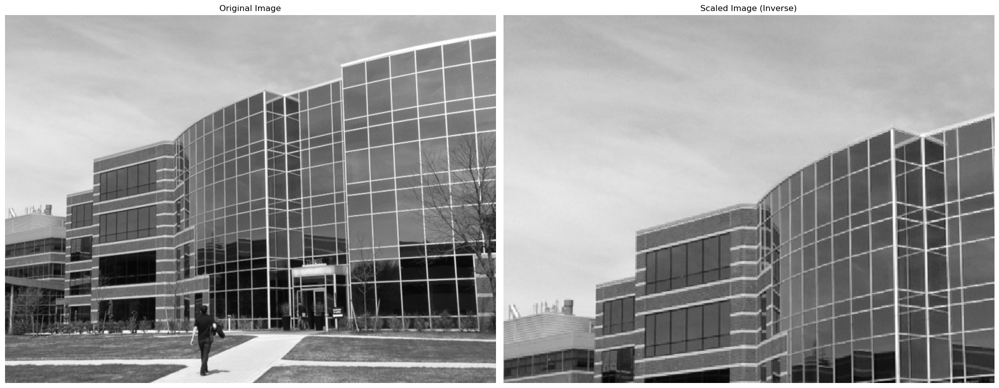

In [ ]:
def apply_inverse_transformation(img, transformation_matrix):
    """
    Applies an inverse (backward) 2D transformation to an image using a given transformation matrix.

    I am creating this function because I know I'll be repeating this code a lot,
    so it's better to have it in one place.

    For clarity, I am conciously omitting a lot of error checking here,
    like checking if the transformation matrix is 2x2,

    Parameters:
    - img: numpy array, the input image.
    - transformation_matrix: numpy array, the 2x2 transformation matrix.

    Returns:
    - img_new: numpy array, the transformed image.
    """
    output_height, output_width = img.shape
    img_new = np.zeros((output_height, output_width))

    T_inv = np.linalg.inv(transformation_matrix)

    for y_new in range(output_height):
        for x_new in range(output_width):
            pt_new = np.array([x_new, y_new])  # Only 2D transformation
            pt_orig = T_inv @ pt_new  # Apply inverse transformation

            x_orig, y_orig = np.rint(pt_orig).astype(int)  # Nearest neighbor

            # Check bounds before assignment
            if 0 <= x_orig < output_width and 0 <= y_orig < output_height:
                img_new[y_new, x_new] = img[y_orig, x_orig]

    return img_new

# Create the transform matrix
scale_a = 1.5  # Scale factor along x-axis
scale_b = 1.5  # Scale factor along y-axis

T = create_scale_matrix(scale_a, scale_b)

img_new = apply_inverse_transformation(img, T)

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Scaled Image (Inverse)")
plt.imshow(img_new, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

<font color='blue'>

## Question: Why does this fill the gaps?

<font color='green'>

## Answer
This approach fills the gaps because we iterate over every pixel in the output image, mapping them back to the corresponding coordinates in the input image using the inverse transformation (if it exists - see next question). By doing so, we ensure that every pixel in the output image is assigned a value based on the invserse mapping (from output to input). In contrast, forward mapping does not guarantee this, as aliasing and rounding can cause some output pixels to remain unassigned when input pixels are transformed to non-integer or overlapping positions (e.g. we saw this with the original black pixels being retained).


<font color='blue'>

## Question: We use the inverse of the scaling matrix above. To estimate this, we use the Numpy function. But how would we calculate it directly, for the scaling matrix? Or, to put it another way, what does the inverse of the scaling matrix look like?

<font color='green'>

## Answer

### General Inverse of a 2D Matrix
The inverse of a 2D matrix exists if the matrix is square (2x2 in this case) and has a non-zero *determinant*. Here is the step-by-step process for calculation the inverse of a general matrix:

Let the 2x2 matrix be:

$$
\mathbf{A} =
\begin{bmatrix}
a & b \\
c & d
\end{bmatrix}
$$

Find the determinant of the matrix where the determinant of the matrix $\mathbf{A}$ is given by:

$$
\text{det}(\mathbf{A}) = ad - bc
$$

If $\text{det}(\mathbf{A}) = 0$, the matrix $\mathbf{A}$ does not have an inverse, we stop (raise an exception). A zero determinant means the matrix is singular or non-invertible.

Now, find the adjoint matrix, which is the transpose of the matrix of cofactors:

$$
\text{adj}(\mathbf{A}) =
\begin{bmatrix}
d & -b \\
-c & a
\end{bmatrix}
$$

Then divide the Adjoint by the Determinant like so:

$$
\mathbf{A}^{-1} =
\frac{1}{ad - bc}
\begin{bmatrix}
d & -b \\
-c & a
\end{bmatrix}
$$

We can see the matrix is non-invertable if the $\text{det}$ is 0.

#### Note:
See [here](https://github.com/numpy/numpy/blob/760dbe9e65244c8e42ad41949b08b3da0ea0712b/numpy/linalg/_linalg.py#L497) to see why Numpy starts to define this.

<font color='green'>

### Inverse of a 2D Scaling Matrix

A **scaling transformation** in 2D is represented by the diagonal matrix:

$$
\mathbf{S} =
\begin{bmatrix}
s_x & 0 \\
0 & s_y
\end{bmatrix}
$$

where:
- $s_x$ scales along the **x-axis**.
- $s_y$ scales along the **y-axis**.

#### Step 1: Compute the Determinant
The determinant of the scaling matrix is given by:

$$
\det(\mathbf{S}) = s_x \cdot s_y
$$

As shown previously, for the matrix to be **invertible**, the determinant **must be nonzero**, meaning:

$$
s_x \neq 0, \quad s_y \neq 0
$$

If either $s_x$ or $s_y$ is **zero**, the transformation collapses space along the zero'd axis, making it **non-invertible**.

#### Step 2: Compute the Adjoint Matrix
As $\mathbf{S}$ is already diagonal, the **adjoint (cofactor matrix)** remains as:

$$
\text{adj}(\mathbf{S}) =
\begin{bmatrix}
s_y & 0 \\
0 & s_x
\end{bmatrix}
$$

#### Step 3: Compute the Inverse
The inverse of any invertible $2 \times 2$ matrix is:

$$
\mathbf{S}^{-1} = \frac{1}{\det(\mathbf{S})} \cdot \text{adj}(\mathbf{S})
$$

Substituting the determinant and adjoint:

$$
\mathbf{S}^{-1} =
\frac{1}{s_x s_y}
\begin{bmatrix}
s_y & 0 \\
0 & s_x
\end{bmatrix}
$$

Since multiplying a diagonal matrix by a scalar scales each entry, we simplify:

$$
\mathbf{S}^{-1} =
\begin{bmatrix}
\frac{1}{s_x} & 0 \\
0 & \frac{1}{s_y}
\end{bmatrix}
$$

#### General Formula for the Inverse of a Scaling Matrix:
$$
\mathbf{S}^{-1} =
\begin{bmatrix}
\frac{1}{s_x} & 0 \\
0 & \frac{1}{s_y}
\end{bmatrix}, \quad \text{where } s_x \neq 0, \quad s_y \neq 0
$$

<font color='green'>

### Example Calculation
If we scale an image using:

$$
\mathbf{S} =
\begin{bmatrix}
2 & 0 \\
0 & 3
\end{bmatrix}
$$

The inverse scaling transformation is:

$$
\mathbf{S}^{-1} =
\begin{bmatrix}
\frac{1}{2} & 0 \\
0 & \frac{1}{3}
\end{bmatrix} =
\begin{bmatrix}
0.5 & 0 \\
0 & 0.333
\end{bmatrix}
$$

This means:
- The **x-coordinates** are scaled by \( 0.5 \) (i.e. in this case, halved).
- The **y-coordinates** are scaled by \( 0.333 \) (and shrunk to one-third here).

**So, scaling is always invertible unless one of the scale factors is zero.** - and our scaling function should catch this during input validation.

In [ ]:
#Let's confirm the above
scale_matrix = create_scale_matrix(2, 3)

print("Scale matrix:")
print(scale_matrix)

#Determine the inverse scale matrix:
scale_matrix_inv = np.linalg.inv(scale_matrix)
print("Inverse scale matrix:")
print(scale_matrix_inv)

Scale matrix:
[[2 0]
 [0 3]]
Inverse scale matrix:
[[0.5        0.        ]
 [0.         0.33333333]]


## More transforms

### Shear and Rotation

You now have a template for applying arbitrary 2D transforms to an image, using back-mapping.

Recall, the shearing transform is given by
$$
\textbf{T}_s = \begin{bmatrix}
1 & a \\
b & 1
\end{bmatrix}
$$
Where $a$ and $b$ are the shearing parameters, in this case. Rotation is given by
$$
\textbf{T}_r = \begin{bmatrix}
\cos(\theta) & -\sin(\theta) \\
\sin(\theta) & \cos(\theta)
\end{bmatrix}
$$
Where $\theta$ is the rotation angle. Rotation matrices are typically also denoted $\textbf{R}$.

<font color='blue'>

#### Task:

In two separate cells, transform the the image using:
 * Shear
 * Rotation
    
You can feel free to copy down and adapt your code from above.

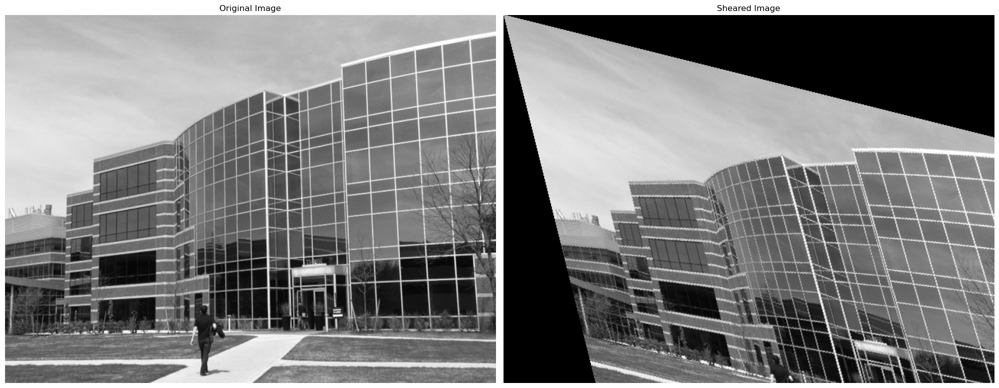

In [ ]:
def create_shear_matrix(scale_a, scale_b):
    """
    Creates a 2D shear matrix given the scale factors along the x and y axes.

    Parameters:
    - scale_a: float, the scale factor along the x-axis.
    - scale_b: float, the scale factor along the y-axis.

    Returns:
    - T_sheared: numpy array, the shear matrix.
    """

    return np.array([
        [1, scale_a],
        [scale_b, 1]
    ])

# Create the transform matrix
scale_a = 0.25  # Scale factor along x-axis
scale_b = 0.25  # Scale factor along y-axis

T_s = create_shear_matrix(scale_a, scale_b)

img_new = apply_inverse_transformation(img, T_s)

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Sheared Image")
plt.imshow(img_new, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

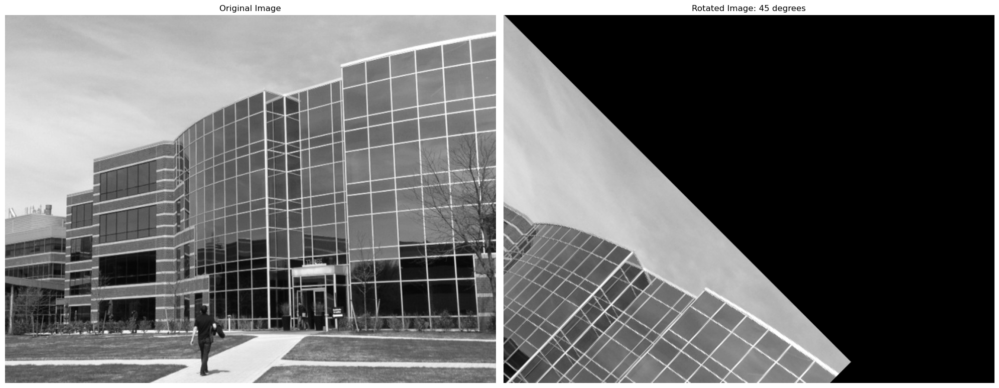

In [ ]:
def create_rotation_matrix(angle_in_degrees):
    """
    Creates a 2D rotation matrix given an angle in degrees.

    Parameters:
    - angle: float, the rotation angle in degrees.

    Returns:
    - T_R: numpy array, the rotation matrix.
    """
    theta = np.radians(angle_in_degrees)  # We need to convert to radians

    return  np.array([
        [np.cos(theta), -np.sin(theta)],
        [np.sin(theta), np.cos(theta)]
    ])

# Rotation matrix
angle = 45  # Rotation angle in degrees
T_R = create_rotation_matrix(angle)

img_new = apply_inverse_transformation(img, T_R)

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f'Rotated Image: {angle} degrees')
plt.imshow(img_new, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

<font color='blue'>

## Question: why does the rotation "rotate" in a clockwise manner with positive angles?

<font color='green'>

## Answer

The reason for this is because of the coordinate system that is used. The origin of the transform is in the top left, with the y-axis pointing down and the x-axis poing to the right. In this case, a positive angle will rotate clockwise - we can see this in the derivation of the rotation matrix int he notes - with positve $\phi$ and positive $\Theta$.

## Combining 2D transformations

The 2D transformations can be combined together, through matrix multiplication. Say we have two different transforms, $\textbf{T}_1$ and $\textbf{T}_2$. We have an image, that we wish to transform by $\textbf{T}_2$ first, and then $\textbf{T}_1$. Well, instead of doing two matrix multiplications on every point in the image, we can combine the transformations into a single matrix through matrix multiplication ($\textbf{T} = \textbf{T}_1\textbf{T}_2$, where $\textbf{T}$ is the overall matrix representation of the two transformations), and thus apply the two transforms using a single matrix multiplication.

<font color='blue'>
    
#### Task:

Combine the shear and rotation transformation by defining each matrix separately, and then multiplying them together.
    
In one code cell, apply it as $\textbf{T} = \textbf{T}_s\textbf{T}_r$
    
In another code cell, apply it as $\textbf{T} = \textbf{T}_r\textbf{T}_s$ (inverting the order of multiplication of the matrices)

[[ 0.9910254  -0.28349365]
 [ 0.71650635  0.7410254 ]]


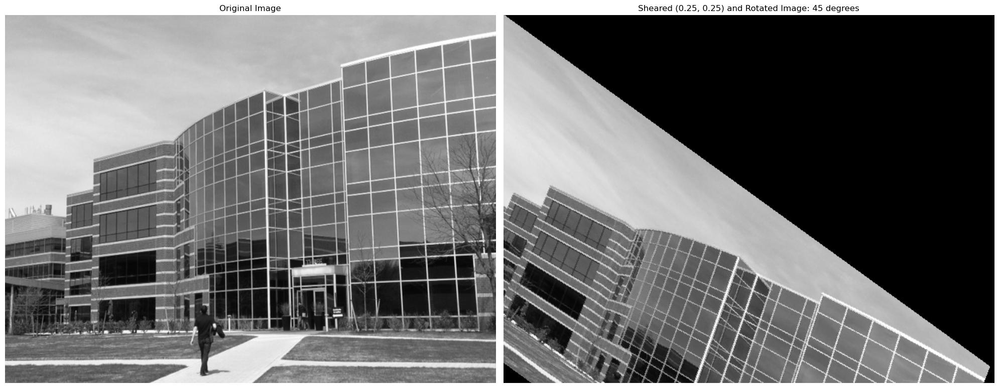

In [ ]:
##################
# Your code here

scale_a = 0.25  # Scale factor along x-axis
scale_b = 0.25  # Scale factor along y-axis
T_sheared = create_shear_matrix(scale_a, scale_b)

angle_in_degrees = 30
T_R = create_rotation_matrix(angle_in_degrees)

T = T_sheared @ T_R

print(T)

img_new = apply_inverse_transformation(img, T)

# Display the new image
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f'Sheared ({scale_a}, {scale_b}) and Rotated Image: {angle} degrees')
plt.imshow(img_new, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

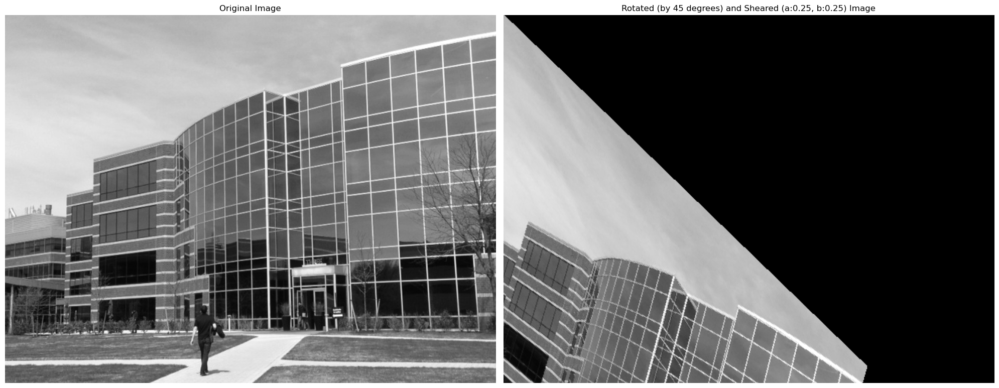

In [ ]:
##################
# Your code here

##################
scale_a = 0.25  # Scale factor along x-axis
scale_b = 0.25  # Scale factor along y-axis
T_sheared = create_shear_matrix(scale_a, scale_b)

angle_in_degrees = 30
T_R = create_rotation_matrix(angle_in_degrees)

T =  T_R @ T_sheared

img_new = apply_inverse_transformation(img, T)

# Display the new image
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f'Rotated (by {angle} degrees) and Sheared (a:{scale_a}, b:{scale_b}) Image')
plt.imshow(img_new, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

<font color='blue'>

## Question: When the two transforms are applied in different order, the result is different. Why is this?

<font color='green'>

## Answer

Matrix multiplication is not commutative. The geometric intuition for this is because when matrix operations are applied, they change the relationship between the output pixels and with the reference coordinate system. So, the order of operation matters. For example, a rotation, followed by a translation is different to a translation followed by a rotation because your relationship with the origin is different and the intermediate stage.

# Extra Credit

Some extra credit if you complete the following task. I will give you extra marks to compesnate for any failings in the other tasks in this e-tivity (if any).

<font color='blue'>
    
#### Task:

Take one of the transforms above, and do an implementation where you expland the size of the image to account for pixels that are outside the resulting image in the original implementation. You only need to account for the extra pixels in the positive axis dimensions. That is, if a pixel is transformed to a point with negative dimension values, you can still ignore this.
    
**Hint**: You can figure out the resulting image dimensions by forward transforming the four corners of the image.

In [ ]:
##################
# Your code here

def apply_inv_transformation_resizable(img, transformation_matrix, resize_output=False):
    """
    Applies a 2D transformation to an image using a given transformation matrix.

    For clarity, I am conciously omitting a lot of error checking here,
    like checking if the transformation matrix is 2x2,

    Parameters:
    - img: numpy array, the input image.
    - transformation_matrix: numpy array, the 3x3 transformation matrix.
    - resize_output: bool, whether to resize the output image to fit the transformed image. If false,
      the output image will be the same size as the input image, else it will resize. In that case the
      output size will be dtermined by the bounding box of the (forward) transformed image.

    Returns:
    - img_new: numpy array, the transformed image.
    """
    if resize_output:
        # Define the corners of the original image in homogeneous coordinates
        corners = np.array([
            [0, 0, 1],                                  # Top-left corner
            [img.shape[1] - 1, 0, 1],                   # Top-right corner
            [0, img.shape[0] - 1, 1],                   # Bottom-left corner
            [img.shape[1] - 1, img.shape[0] - 1, 1]     # Bottom-right corner
        ])

        # Transform the corners - using forweard mapping
        corners_new = (T @ corners.T).T  # Transform and transpose back for the proper shape

        # Normalise homogeneous coordinates (divide by the third coordinate)
        corners_new /= corners_new[:, 2][:, np.newaxis]

        # Find the minimum and maximum x and y values (bounding box of the transformed image)
        x_min = np.min(corners_new[:, 0])
        x_max = np.max(corners_new[:, 0])

        y_min = np.min(corners_new[:, 1])
        y_max = np.max(corners_new[:, 1])

        # Create a new empty image of the size of the transformed image
        # this is where we will do the inverse mapping from. The size
        # is determined by the bounding box of the transformed image
        # which we calculated previously using the forward mapping on the corners
        output_width = int(np.ceil(x_max - x_min))
        output_height = int(np.ceil(y_max - y_min))

        T_adjusted = np.array([
            [transformation_matrix[0, 0], transformation_matrix[0, 1], transformation_matrix[0, 2] - x_min
            ],
            [transformation_matrix[1, 0], transformation_matrix[1, 1], transformation_matrix[1, 2] - y_min
            ],
            [0, 0, 1]
        ])
    else:   # No resizing - like the initial function at the start
            # Keep the output image the same size as the input image
        output_height, output_width = img.shape
        T_adjusted = transformation_matrix

    # Now, as before, create an empty output image with the appropriate size
    img_new = np.zeros((output_height, output_width))

    # Compute the inverse of the adjusted transformation matrix
    T_inv = np.linalg.inv(T_adjusted)

    # Now we do backward mapping: Iterate over the output image and map pixels back to the input image
    for y_new in range(output_height):
        for x_new in range(output_width):
            # Map the output pixel back to the input space
            pt_new = np.array([x_new, y_new, 1])
            pt_orig = T_inv @ pt_new

            # Normalise homogeneous coordinates
            pt_orig /= pt_orig[2]

            # Use nearest-neighbour interpolation by rounding to the nearest integer
            x_orig, y_orig = np.rint(pt_orig[:2]).astype(int)

            # Check if the original coordinates are within bounds - required if no reisizing
            if 0 <= x_orig < img.shape[1] and 0 <= y_orig < img.shape[0]:
                # Copy the pixel value to the output image
                img_new[y_new, x_new] = img[y_orig, x_orig]

    return img_new

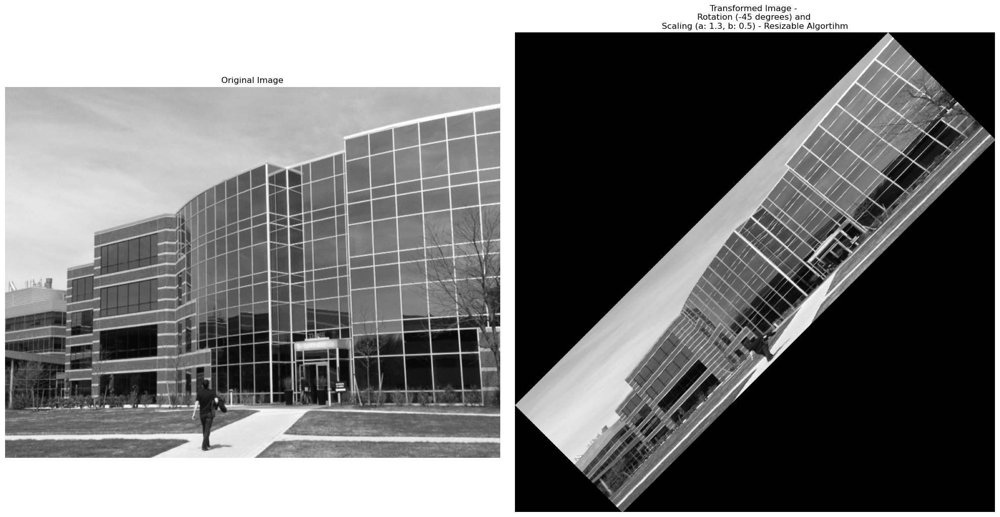

In [ ]:
angle = -45
theta = np.radians(angle)  # We need to convert to radians

# Define the transformation matrices as a 3x3 homogeneous transformation
# We use homogenous coordinates here because 2x2 matriuces can't represent translation
# and we want to be able to do all transformations in one go - hence we need a 3x3 matrix
T_R = np.array([
    [np.cos(theta), -np.sin(theta), 0],
    [np.sin(theta), np.cos(theta), 0],
    [0, 0, 1]
])

scale_a = 1.3
scale_b = 0.5

T_s = np.array([  # Example scaling matrix (update as per your scale factors)
    [scale_a, 0, 0],
    [0, scale_b, 0],
    [0, 0, 1]
])

# Combine rotation and scaling matrices into a single transformation matrix
T = T_R @ T_s

img_new = apply_inv_transformation_resizable(img, T, resize_output=True)

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f'Transformed Image - \nRotation ({angle} degrees) and \nScaling (a: {scale_a}, b: {scale_b}) - Resizable Algortihm')
plt.imshow(img_new, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

We could take this one step further and allow the user to set the origin of the ttransform. Right now it is at the top-left of the image. But, sometimes it makes sense to set the origin to the centre of the image. I think it's out of scope in this example.

# Bibliography

* [Foundations of Computer Vision by Antonio Torralba, Phillip Isola](https://www.amazon.co.uk/Foundations-Computer-Adaptive-Computation-Learning/dp/0262048973/)

# Appendix

## A1. A quick look at benefits of vectorisation (or getting away from loops)
Our loop-based approach is great for learning but doesn't offer any benefits when using modern h/w and programming practices (e.g. better utilisation of cache because of memory layout, loops are expensive for thepython interpreter, also,, prepping the memory this way means the underlying c library in numpy can use SSE or AVX instructions more effectively). The following compares the speed of looping over each pixel, compared to vectorising the image and transforms.

In [ ]:
def apply_transformation_vectorised(img, transformation_matrix):
    """
    Applies a 2D transformation to an image using a given transformation matrix.

    Parameters:
    - img: numpy array, the input image.
    - transformation_matrix: numpy array (2x2), the transformation matrix.

    Returns:
    - img_new: numpy array, the transformed image.
    """
    height, width = img.shape

    img_new = np.zeros_like(img)

    T_inv = np.linalg.inv(transformation_matrix)

    # Generate coordinate grid for output image
    x_new, y_new = np.meshgrid(np.arange(width), np.arange(height))

    # Flatten coordinate arrays for vectorised operations
    # ravel is just a reshape that doesn't create a copy
    # - a view on contiguous memory
    coords = np.vstack([x_new.ravel(), y_new.ravel()])

    orig_coords = T_inv @ coords

    # nearest-neighbor interpolation)
    x_orig = np.rint(orig_coords[0]).astype(int)
    y_orig = np.rint(orig_coords[1]).astype(int)

    # Ensure coordinates are within bounds
    x_valid = (0 <= x_orig) & (x_orig < width)
    y_valid = (0 <= y_orig) & (y_orig < height)
    valid = x_valid & y_valid  # Element-wise AND condition

    # Assign valid pixel values using NumPy ad. indexing
    img_new[y_new.ravel()[valid], x_new.ravel()[valid]] = img[y_orig[valid], x_orig[valid]]

    return img_new

Loop-based approach time: 0.73059 seconds
Vectorised approach time: 0.03208 seconds
Speedup Factor: 22.77x faster


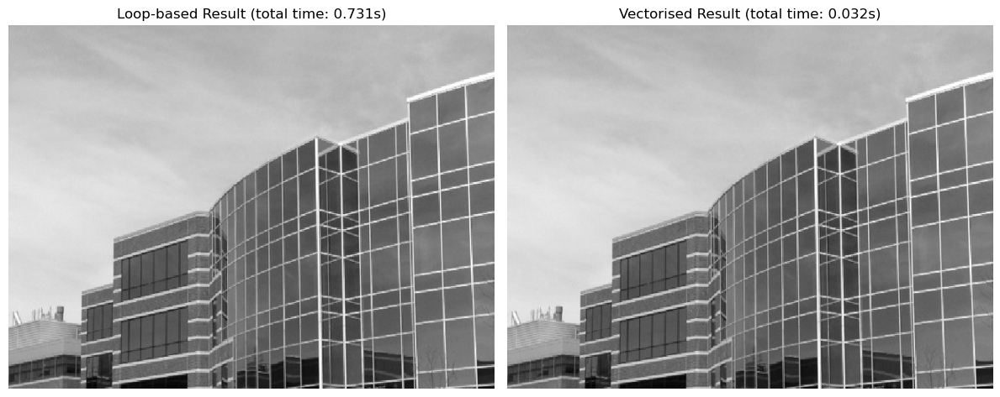

In [ ]:
import time

# Define transformation matrix (example: scale x2)
scale_x = 1.2
scale_y = 1.5
T = np.array([
    [scale_x, 0],
    [0, scale_y]
])

# Time the loop-based approach
start_time = time.perf_counter()
img_loop = apply_inverse_transformation(img, T)
end_time = time.perf_counter()
loop_time = end_time - start_time

# Time the vectorized approach
start_time = time.perf_counter()
img_vectorised = apply_transformation_vectorised(img, T)
end_time = time.perf_counter()
vectorised_time = end_time - start_time

# Print the results
print(f"Loop-based approach time: {loop_time:.5f} seconds")
print(f"Vectorised approach time: {vectorised_time:.5f} seconds")
print(f"Speedup Factor: {loop_time / vectorised_time:.2f}x faster")

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title(f"Loop-based Result (total time: {loop_time:.3f}s)")
plt.imshow(img_loop, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f"Vectorised Result (total time: {vectorised_time:.3f}s)")
plt.imshow(img_vectorised, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

So, we see the cost of using the for loop. It's great for learning and developing intution but is not suitable if speed is your aim.

## A2. Visualising the Effect of Affine Transformations on Points Using Homogeneous Coordinates
The following show the same effects, previously shown, but done using 3x3 matrices. This is done to validate the body of the assignment.

In [ ]:
def apply_transformation_3x3(points, matrix):
    """
    Apply a 2D transformation matrix to a set of points.

    Parameters:
        points (numpy.ndarray): Array of shape (N, 2) representing N points.
        matrix (numpy.ndarray): 3x3 transformation matrix.

    Returns:
        numpy.ndarray: Transformed points of shape (N, 2).
    """
    ones = np.ones((points.shape[0], 1))
    points_h = np.hstack([points, ones])
    transformed_points_h = points_h @ matrix.T
    return transformed_points_h[:, :2]

def create_rotation_matrix_3x3(theta):
    """
    Creates a 3x3 rotation matrix for a given angle theta (in degrees).
    """
    theta_radians = np.radians(theta)  # Convert to radians
    return np.array([
        [np.cos(theta_radians), -np.sin(theta_radians), 0],
        [np.sin(theta_radians),  np.cos(theta_radians), 0],
        [0, 0, 1]
    ])

def create_scaling_matrix_3x3(sx, sy):
    """
    Returns a 3x3 scaling matrix.
    """
    return np.array([
        [sx,  0, 0],
        [0, sy, 0],
        [0,  0, 1]
    ])

def create_shear_matrix_3x3(shx, shy):
    """
    Returns a 3x3 shear matrix.
    """
    return np.array([
        [1, shx, 0],
        [shy, 1,  0],
        [0,  0,  1]
    ])

def plot_transformation(original, transformed, title):
    plt.figure(figsize=(6, 6))
    plt.plot(original[:, 0], original[:, 1], 'bo-', label='Original', alpha=0.5)
    plt.plot(transformed[:, 0], transformed[:, 1], 'ro-', label='Transformed', alpha=0.7)
    plt.xlabel('X')
    plt.ylabel('Y (Top-Down)')
    plt.gca().invert_yaxis()  # Ensure Y increases downward
    plt.title(title)
    plt.legend()
    plt.grid()
    plt.axis('equal')
    plt.show()

Create a box that has the same dimensions as the image we used previously.

In [ ]:
rectangle = np.array([
    [0, 0], [640, 0], [640, 480], [0, 480], [0, 0]
])

Now, redo the basic transformations:

- Scaling
- Shear
- Rotation

The **scaling transformation matrix** in homogeneous coordinates is:

$$
S =
\begin{bmatrix}
    s_x & 0 & 0 \\
    0 & s_y & 0 \\
    0 & 0 & 1
\end{bmatrix}
$$

The **shear transformation matrix** is:

$$
S =
\begin{bmatrix}
    1 & \text{shear}_x & 0 \\
    \text{shear}_y & 1 & 0 \\
    0 & 0 & 1
\end{bmatrix}
$$

The **rotation transformation matrix** is:

$$
R =
\begin{bmatrix}
    \cos 90^\circ & -\sin 90^\circ & 0 \\
    \sin 90^\circ & \cos 90^\circ & 0 \\
    0 & 0 & 1
\end{bmatrix}
$$

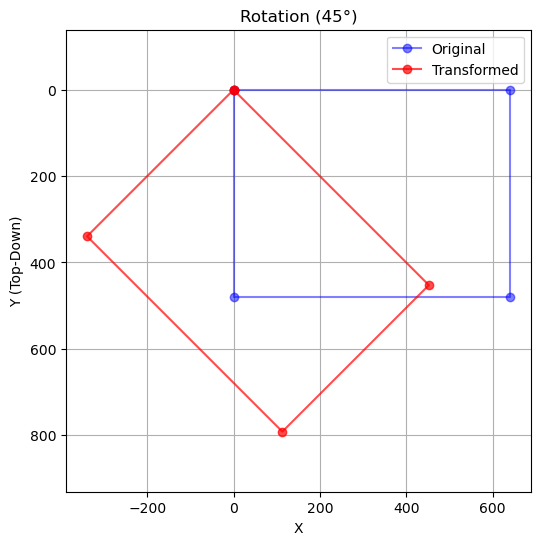

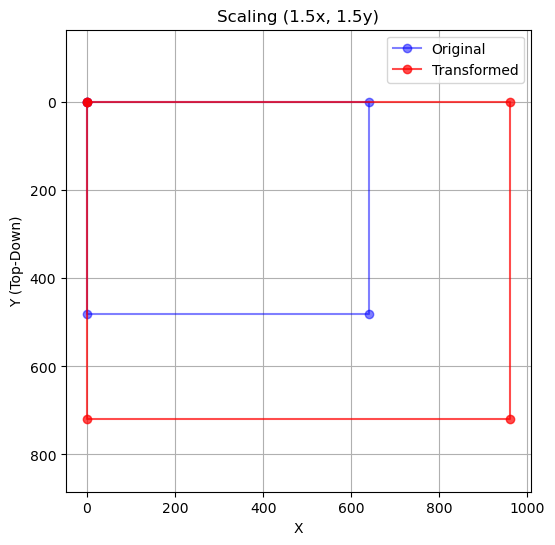

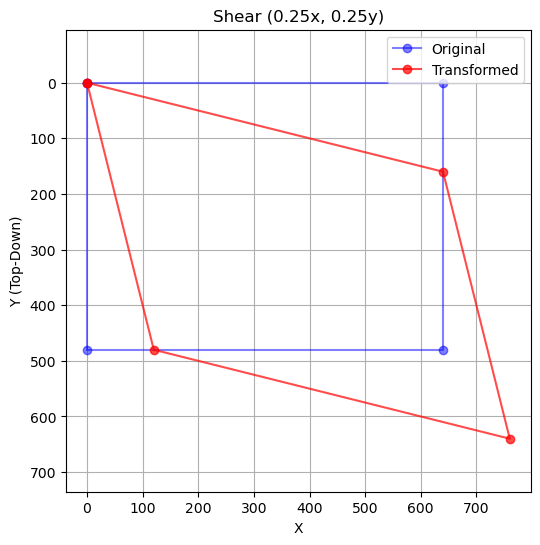

In [ ]:
angle = 45
rot_matrix = create_rotation_matrix_3x3(angle)
rotated_square = apply_transformation_3x3(rectangle, rot_matrix)
plot_transformation(rectangle, rotated_square, f'Rotation ({angle}°)')

scale_a = 1.5
scale_b = 1.5
scale_matrix = create_scaling_matrix_3x3(scale_a, scale_b)
scaled_square = apply_transformation_3x3(rectangle, scale_matrix)
plot_transformation(rectangle, scaled_square, f'Scaling ({scale_a}x, {scale_b}y)')

shear_a = 0.25
shear_b = 0.25
shear_matrix = create_shear_matrix_3x3(shear_a, shear_b)
sheared_square = apply_transformation_3x3(rectangle, shear_matrix)
plot_transformation(rectangle, sheared_square, f'Shear ({shear_a}x, {shear_a}y)')

### Transformation Process: Shear → Rotate

Now, demonstrate the combined transforms. The **combined transformation** is applied as:


$$
C = S \times R
$$

Where $S$ is shear and $R$ is rotation.

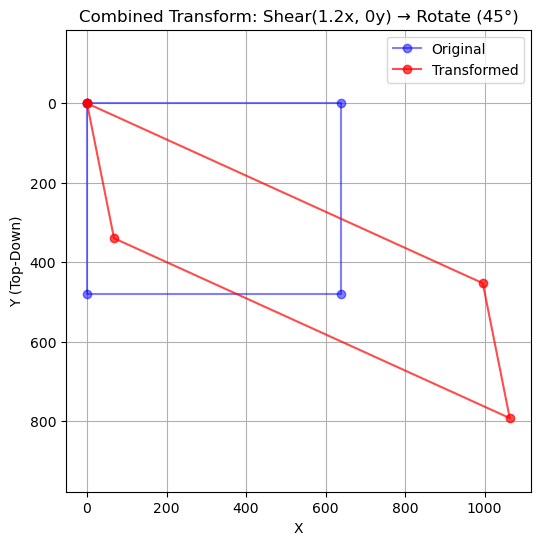

In [ ]:
shear_a = 1.2
shear_b = 0
shear_matrix = create_shear_matrix_3x3(shear_a, shear_b)

angle = 45
rot_matrix = create_rotation_matrix_3x3(angle)

combined_matrix = shear_matrix @ rot_matrix
combined_square = apply_transformation_3x3(rectangle, combined_matrix)

plot_transformation(rectangle, combined_square, f'Combined Transform: Shear({shear_a}x, {shear_b}y) → Rotate ({angle}°)')

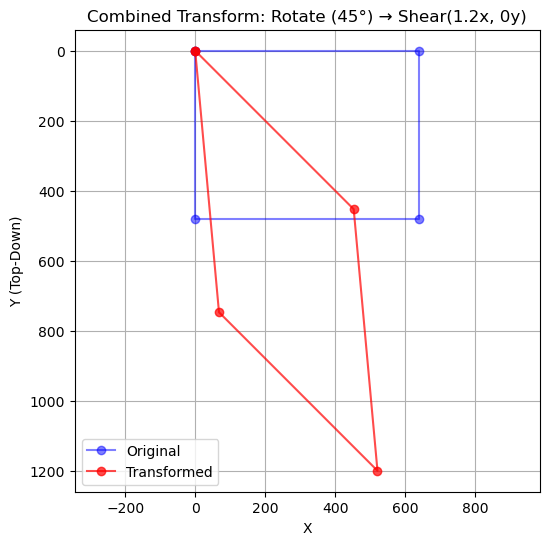

In [ ]:
rot_matrix = create_rotation_matrix_3x3(angle)
shear_matrix = create_shear_matrix_3x3(shear_a, shear_b)

combined_matrix = rot_matrix @ shear_matrix
combined_square = apply_transformation_3x3(rectangle, combined_matrix)

plot_transformation(rectangle, combined_square, f'Combined Transform: Rotate ({angle}°) → Shear({shear_a}x, {shear_b}y)')

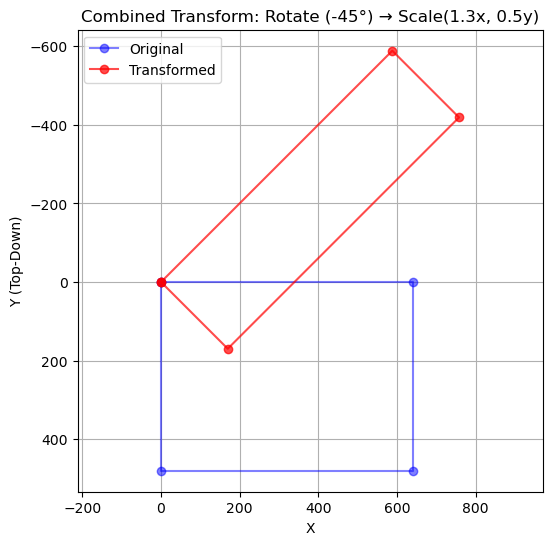

In [ ]:
angle = -45
rot_matrix = create_rotation_matrix_3x3(angle)

scale_a = 1.3
scale_b = 0.5
scale_matrix = create_scaling_matrix_3x3(scale_a, scale_b)

combined_matrix = rot_matrix @ scale_matrix
combined_square = apply_transformation_3x3(rectangle, combined_matrix)

plot_transformation(rectangle, combined_square, f'Combined Transform: Rotate ({angle}°) → Scale({scale_a}x, {scale_b}y)')